In [ ]:
## Unzip Zip File

import os
import zipfile

def unzip_file(zip_file_path, extract_to_folder):
    if not os.path.exists(zip_file_path):
        print(f"The zip file {zip_file_path} does not exist.")
        return

    if not os.path.exists(extract_to_folder):
        os.makedirs(extract_to_folder)

    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_folder)
        print(f"Zip file extracted to {extract_to_folder}")

In [ ]:
zip_file_path = "/content/drive/MyDrive/DL/Face Recognition Files.zip"

In [ ]:
extract_to_folder = '/content'

In [ ]:
unzip_file(zip_file_path, extract_to_folder)

Zip file extracted to /content


In [ ]:
images_path = '/content/face_recognition_files/faces_lecture'

In [ ]:
img_path = '/content/face_recognition_files/faces_lecture/face11.png'

In [ ]:
!pip install deepface

In [ ]:
## Import Operations

from deepface import DeepFace
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


## Age Detection

In [ ]:
## Age Analysis

result = DeepFace.analyze(img_path=img_path, actions=['age'])

In [ ]:
## Display the image and print gender information as a caption based on the DeepFace analysis result.

import cv2
import matplotlib.pyplot as plt

def visualize(img_path, result, attribute='age'):
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if attribute in result[0]:
        prediction = result[0][attribute]
        text = f"{attribute}: {prediction}"
    else:
        text = f"{attribute} not found in result"

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1.5
    thickness = 2
    color = (255, 255, 255)
    shadow_color = (0, 0, 0)


    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(text)
    plt.show()

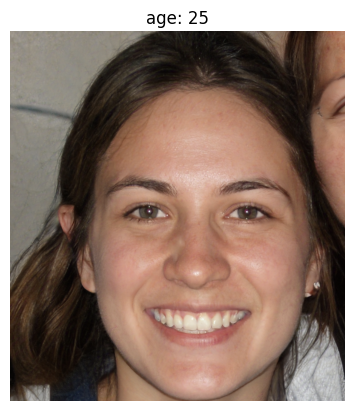

In [ ]:
## The visualize function defined earlier is called and the analyzed age information is displayed on the image.

visualize(img_path, result, "age")

In [ ]:
## Adds the full path of all files with .jpeg, .jpg and .png extensions in the specified folder to the `image_path` list.

image_path = [os.path.join(images_path,f)for f in os.listdir(images_path)if f.endswith(('jpeg','jpg','png'))]

In [ ]:
image_path

['/content/face_recognition_files/faces_lecture/face13.png',
 '/content/face_recognition_files/faces_lecture/face11.png',
 '/content/face_recognition_files/faces_lecture/face18.png',
 '/content/face_recognition_files/faces_lecture/face19.png',
 '/content/face_recognition_files/faces_lecture/face12.png',
 '/content/face_recognition_files/faces_lecture/face20.png',
 '/content/face_recognition_files/faces_lecture/face16.png',
 '/content/face_recognition_files/faces_lecture/face17.png',
 '/content/face_recognition_files/faces_lecture/face14.png',
 '/content/face_recognition_files/faces_lecture/face15.png']

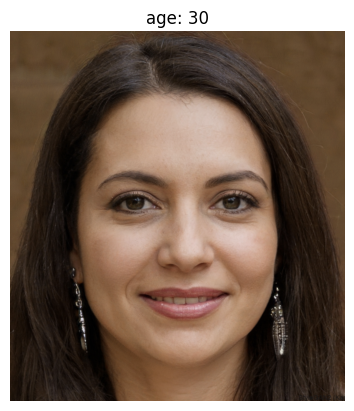

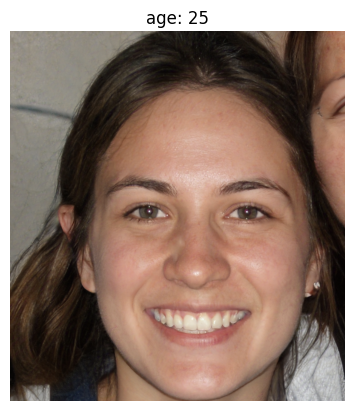

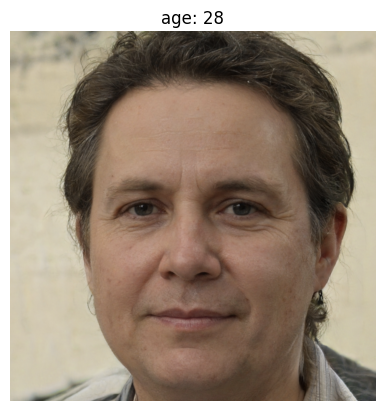

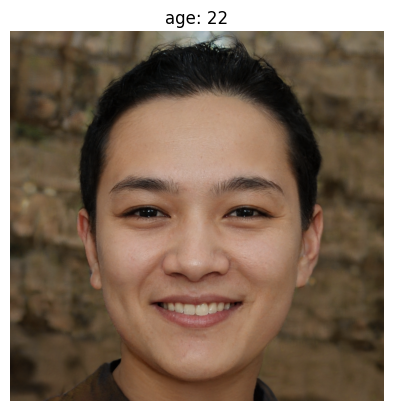

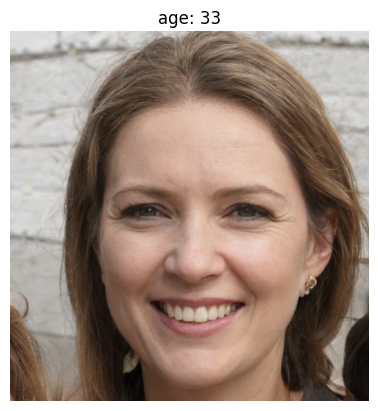

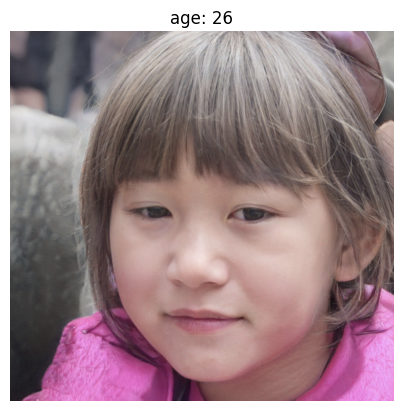

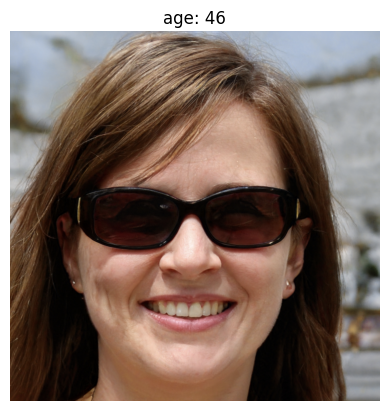

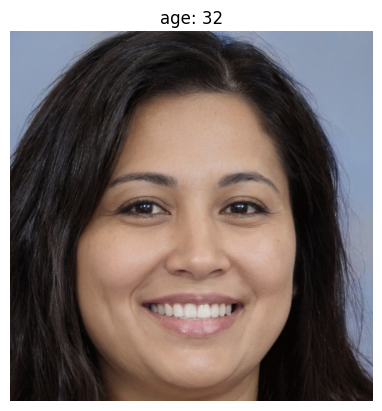

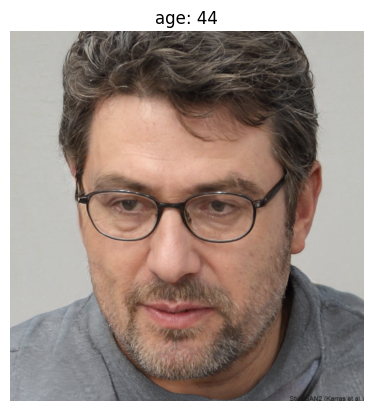

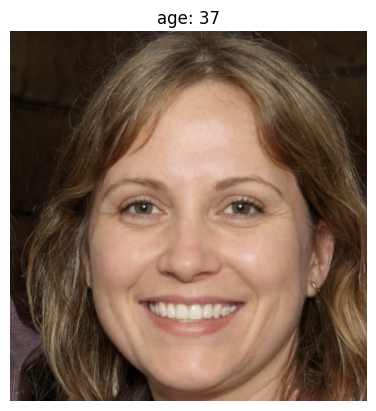

In [ ]:
##  Age Analysis and Visualization for all images

for path in image_path:
    result = DeepFace.analyze(path, actions=["age"])
    visualize(path, result, "age")


## Gender Detection

In [ ]:
img_path2 = "/content/face_recognition_files/faces_lecture/face13.png"

In [ ]:
## Gender analysis with DeepFace

DeepFace.analyze(
    img_path=img_path2,
    actions=["gender"],
    detector_backend="retinaface",
    enforce_detection=True
)

[{'gender': {'Woman': np.float32(99.999825), 'Man': np.float32(0.0001777208)},
  'dominant_gender': 'Woman',
  'region': {'x': 378,
   'y': 355,
   'w': 1082,
   'h': 1441,
   'left_eye': (1207, 913),
   'right_eye': (677, 921),
   'nose': (961, 1239),
   'mouth_left': (1182, 1420),
   'mouth_right': (708, 1427)},
  'face_confidence': 1.0}]

In [ ]:
## Function to visualize gender prediction on images.
import cv2
import matplotlib.pyplot as plt

def visualize(img_path2, result, attribute='gender'):
    image = cv2.imread(img_path2)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if attribute in result[0]:
        prediction = result[0][attribute]

        if isinstance(prediction, dict):
            best_label = max(prediction, key=prediction.get)
            best_score = prediction[best_label]
            text = f"{attribute.capitalize()}: {best_label} ({best_score:.2f}%)"
        else:
            text = f"{attribute.capitalize()}: {prediction}"
    else:
        text = f"{attribute.capitalize()} not found in result"

    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(text)
    plt.show()

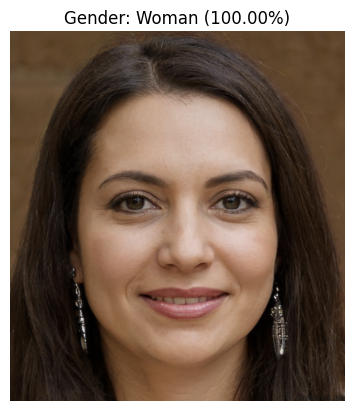

In [ ]:
##  Visualizing gender prediction.

visualize(img_path2, result, "gender")

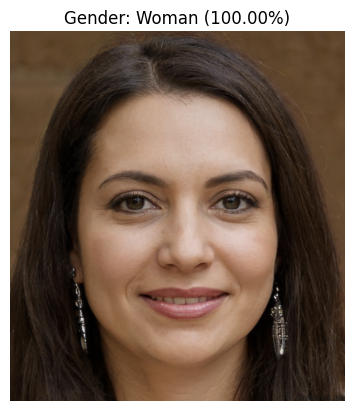

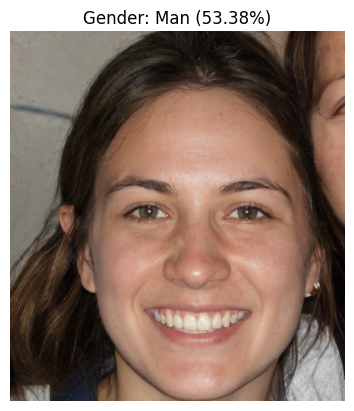

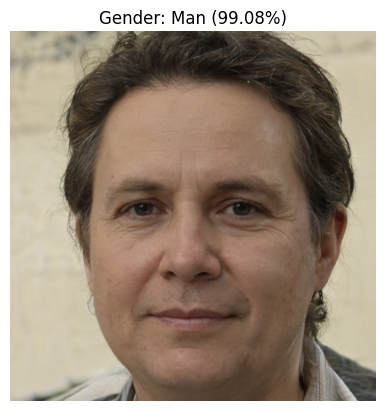

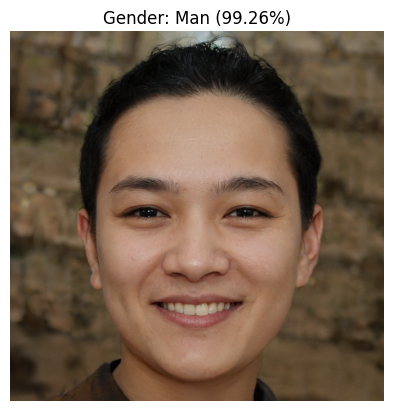

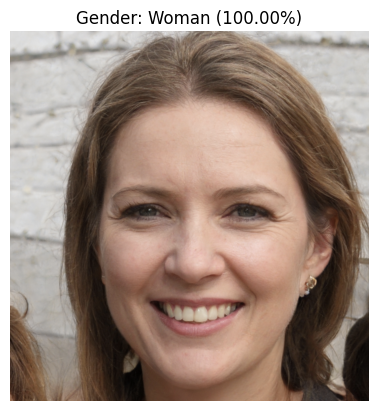

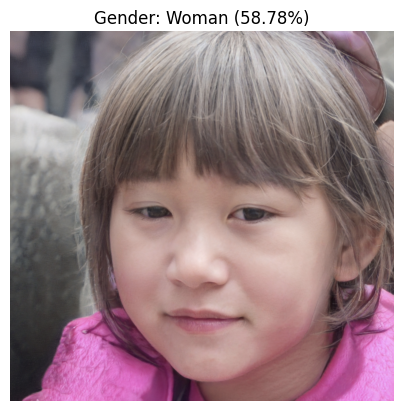

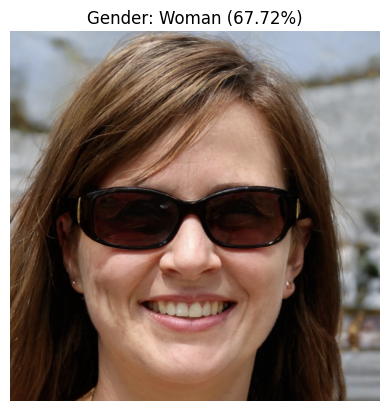

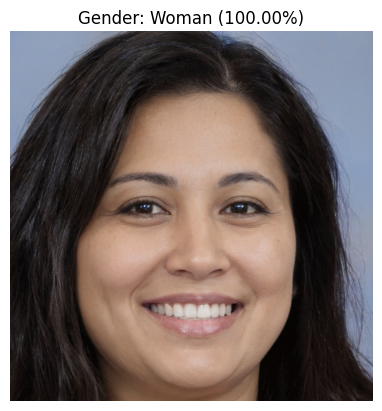

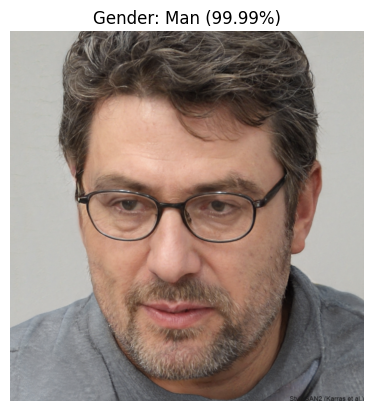

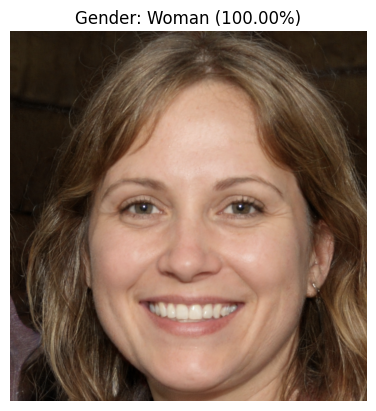

In [ ]:
## A loop that visualizes the results by predicting gender in image files.

for path in image_path:
    result = DeepFace.analyze(path, actions=["gender"])
    visualize(path, result, "gender")

## Race Detection

In [ ]:
img_path3 = "/content/face_recognition_files/faces_lecture/face18.png"

In [ ]:
## Race Analysis

result = DeepFace.analyze(
    img_path=img_path3,
    actions=["race"],
    detector_backend="retinaface",
    enforce_detection=True
)

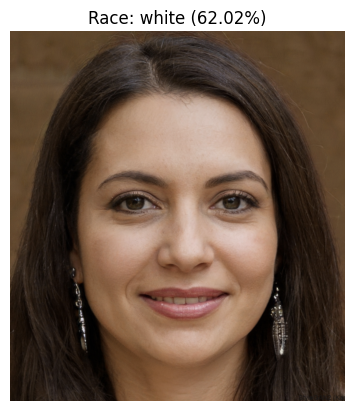

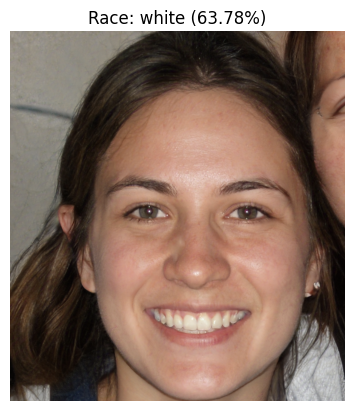

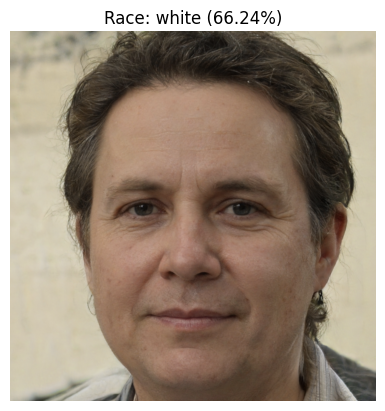

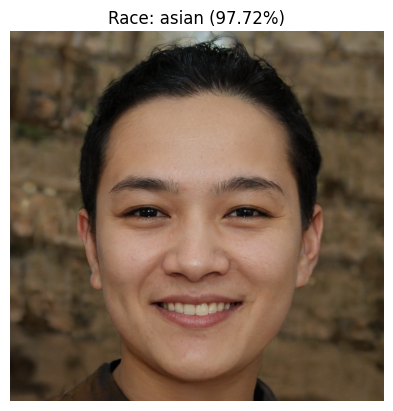

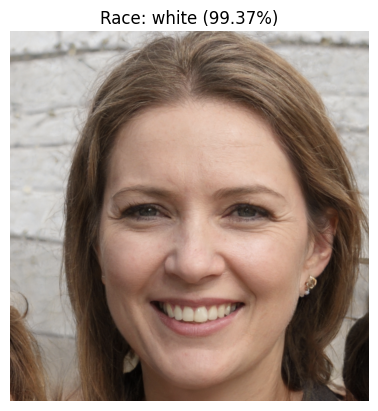

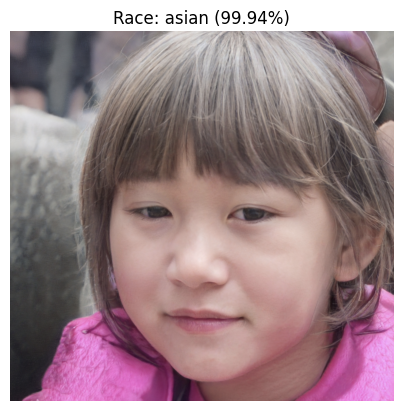

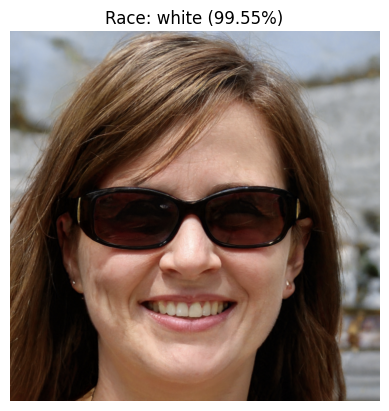

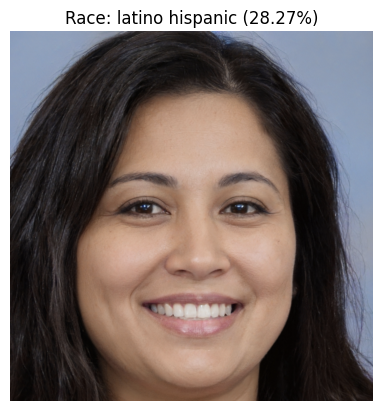

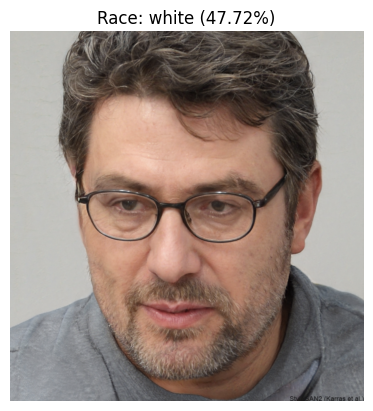

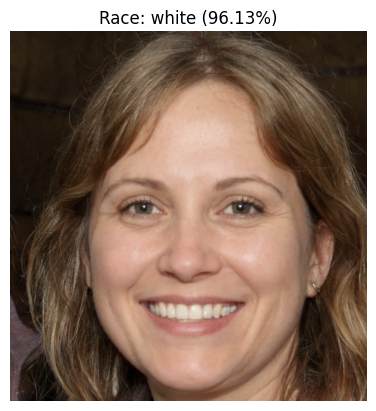

In [ ]:
## Race Analysis and Visualization for all images

for path in image_path:
    result = DeepFace.analyze(path, actions=["race"])
    visualize(path, result, "race")

## Emotion Detection

In [ ]:
img_path4 = "/content/face_recognition_files/faces_lecture/face15.png"

In [ ]:
## RetinaFace for emotion analysis and face detection on images

result = DeepFace.analyze(
    img_path=img_path4,
    actions=["emotion"],
    detector_backend="retinaface",
    enforce_detection=True
)

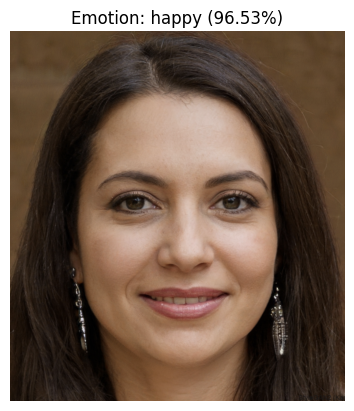

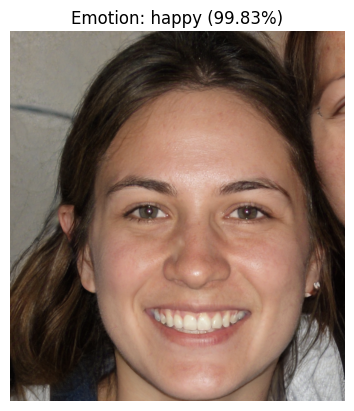

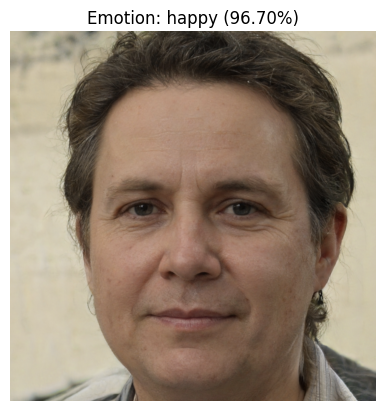

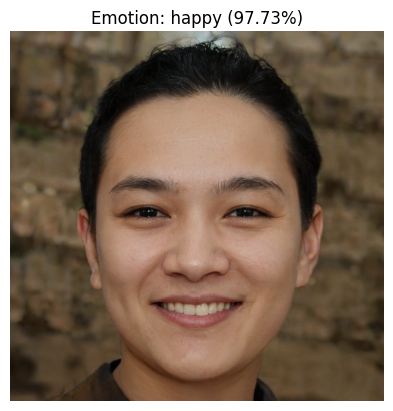

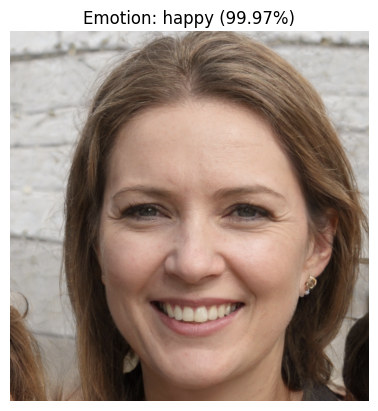

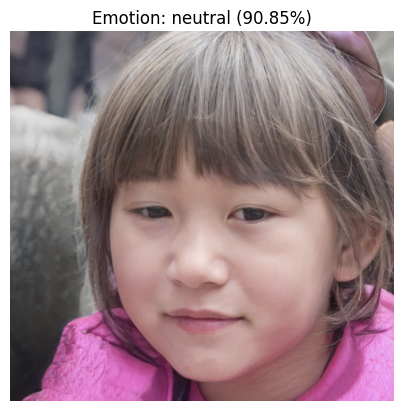

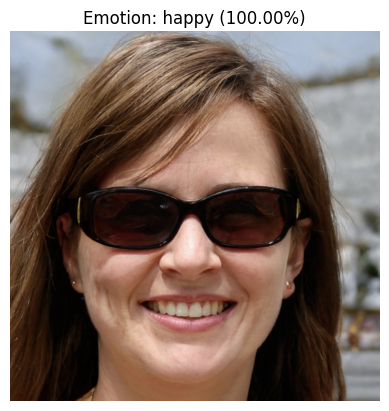

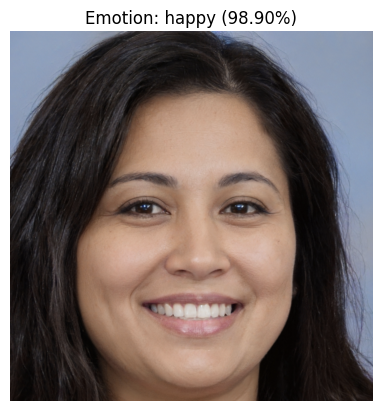

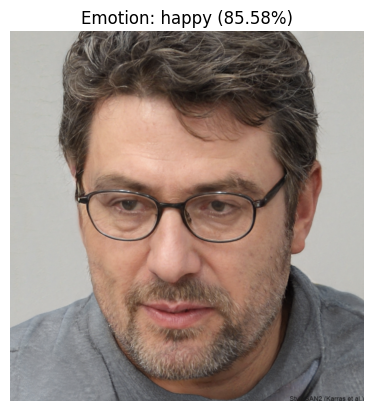

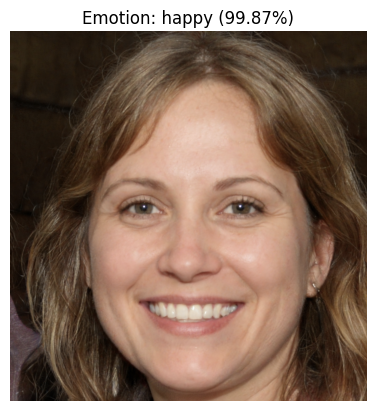

In [ ]:
## A cycle that analyzes the emotional state of images and visualizes the results.

for path in image_path:
    result = DeepFace.analyze(path, actions=["emotion"])
    visualize(path, result, "emotion")

In [ ]:
## Multi-attribute analysis on images (age, gender, race, and emotion)

DeepFace.analyze(img_path = img_path4,actions = ["age","gender","race","emotion"])


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]


[{'age': 37,
  'region': {'x': 289,
   'y': 422,
   'w': 1362,
   'h': 1362,
   'left_eye': (1219, 946),
   'right_eye': (679, 947)},
  'face_confidence': 0.89,
  'gender': {'Woman': np.float32(100.0), 'Man': np.float32(4.5865045e-07)},
  'dominant_gender': 'Woman',
  'race': {'asian': np.float32(0.0023866731),
   'indian': np.float32(0.0037970967),
   'black': np.float32(2.7058788e-05),
   'white': np.float32(96.12966),
   'middle eastern': np.float32(1.6457902),
   'latino hispanic': np.float32(2.2183335)},
  'dominant_race': 'white',
  'emotion': {'angry': np.float32(1.7418822e-13),
   'disgust': np.float32(1.9959272e-21),
   'fear': np.float32(3.3620776e-13),
   'happy': np.float32(99.874985),
   'sad': np.float32(1.2402205e-08),
   'surprise': np.float32(5.5353034e-08),
   'neutral': np.float32(0.12501922)},
  'dominant_emotion': 'happy'}]

In [ ]:
## Face Analysis and Visualization Function

import cv2
import matplotlib.pyplot as plt

def visualize_all(img_path, result):
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the predictions in order
    output = []
    predictions = result[0]

    # Age
    if "age" in predictions:
        output.append(f"Age: {int(round(predictions['age']))}")

    # Gender
    if "gender" in predictions and isinstance(predictions["gender"], dict):
        gender_pred = predictions["gender"]
        best_gender = max(gender_pred, key=gender_pred.get)
        output.append(f"Gender: {best_gender}")
    elif "gender" in predictions:
        output.append(f"Gender: {predictions['gender']}")

    # Race
    if "race" in predictions and isinstance(predictions["race"], dict):
        race_pred = predictions["race"]
        best_race = max(race_pred, key=race_pred.get)
        output.append(f"Race: {best_race}")

    # Emotion
    if "emotion" in predictions and isinstance(predictions["emotion"], dict):
        emotion_pred = predictions["emotion"]
        best_emotion = max(emotion_pred, key=emotion_pred.get)
        output.append(f"Emotion: {best_emotion}")


    title = " | ".join(output)

    # Visualization
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(title)
    plt.show()


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


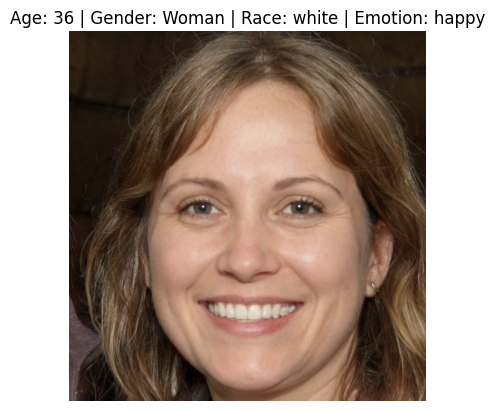

In [ ]:
## Face Feature Analysis and Visualization

result = DeepFace.analyze(
    img_path=img_path4,
    actions=["age", "gender", "race", "emotion"],
    detector_backend="retinaface"
)

visualize_all(img_path4, result)


In [ ]:
pictures_path = "/content/face_recognition_files/faces_assignment"

Analyzing face5...


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]


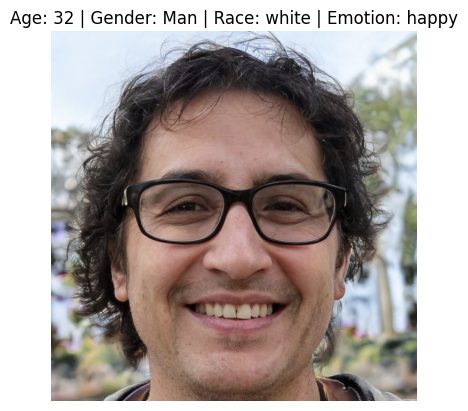

Analyzing face1...


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]


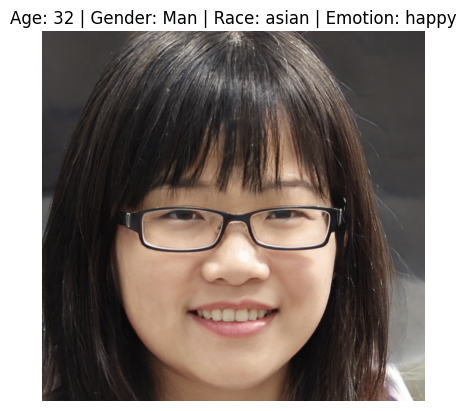

Analyzing face4...


Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]


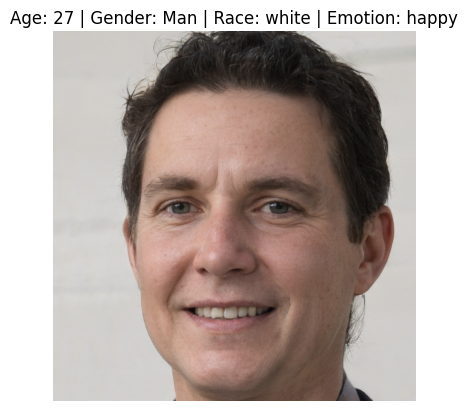

Analyzing face2...


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]


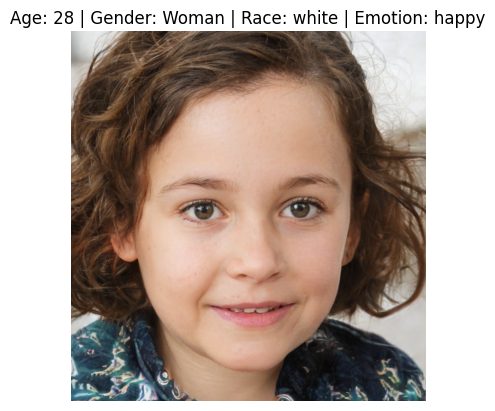

Analyzing face3...


Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]


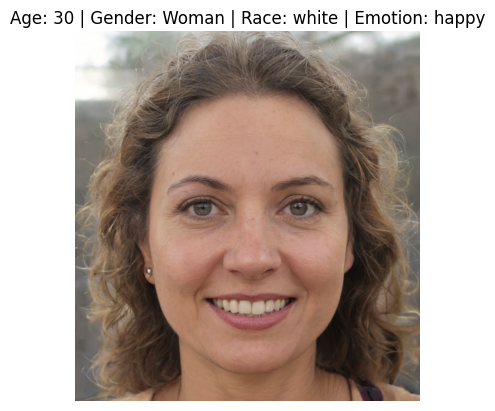

In [ ]:
def visualize_all(img_path, result):
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    output = []
    predictions = result[0]

    if "age" in predictions:
        output.append(f"Age: {int(round(predictions['age']))}")

    if "gender" in predictions:
        gender_pred = predictions["gender"]
        if isinstance(gender_pred, dict):
            best_gender = max(gender_pred, key=gender_pred.get)
        else:
            best_gender = gender_pred
        output.append(f"Gender: {best_gender}")

    if "race" in predictions and isinstance(predictions["race"], dict):
        best_race = max(predictions["race"], key=predictions["race"].get)
        output.append(f"Race: {best_race}")

    if "emotion" in predictions and isinstance(predictions["emotion"], dict):
        best_emotion = max(predictions["emotion"], key=predictions["emotion"].get)
        output.append(f"Emotion: {best_emotion}")

    title = " | ".join(output)

    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(title)
    plt.show()


image_dir = "/content/face_recognition_files/faces_assignment"


image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))]

for path in image_paths:
    filename = os.path.basename(path)
    name_only = os.path.splitext(filename)[0]
    print(f"Analyzing {name_only}...")

    result = DeepFace.analyze(
        img_path=path,
        actions=["age", "gender", "race", "emotion"],
        detector_backend="retinaface"
    )
    visualize_all(path, result)
